# Mod 4 Project

## Importing Libraries and Gathering Data

In [1]:
import urllib.request
import PyPDF2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
import datetime
from nltk.tokenize import RegexpTokenizer
from nltk.probability import FreqDist
from nltk.corpus import stopwords
import sklearn
from sklearn.feature_extraction.text import CountVectorizer 
import nltk
from matplotlib import cm

### Collecting Fed Minutes Data

In [2]:
meeting_dates = ['04/29/2020', '03/15/2020', '01/29/2020', 
                 '12/11/2019', '10/30/2019', '09/18/2019', '07/31/2019', '06/19/2019', '05/01/2019', '03/20/2019', '01/30/2019',
                 '12/19/2018', '11/08/2018', '09/26/2018', '08/01/2018', '06/13/2018', '05/02/2018', '03/21/2018', '01/31/2018',
                 '12/13/2017', '11/01/2017', '09/20/2017', '07/26/2017', '06/14/2017', '05/03/2017', '03/15/2017', '02/01/2017',
                 '12/14/2016', '11/02/2016', '09/21/2016', '07/27/2016', '06/15/2016', '04/27/2016', '03/16/2016', '01/27/2016',
                 '12/16/2015', '10/28/2015', '09/17/2015', '07/29/2015', '06/17/2015', '04/29/2015', '03/18/2015', '01/28/2015',
                 '12/17/2014', '10/29/2014', '09/17/2014', '07/30/2014', '06/18/2014', '04/30/2014', '03/19/2014', '01/29/2014',
                 '12/18/2013', '10/30/2013', '09/18/2013', '07/31/2013', '06/19/2013', '05/01/2013', '03/20/2013', '01/30/2013',
                 '12/12/2012', '10/24/2012', '09/13/2012', '08/01/2012', '06/20/2012', '04/25/2012', '03/13/2012', '01/25/2012',
                 '12/13/2011', '11/02/2011', '09/21/2011', '08/09/2011', '06/22/2011', '04/27/2011', '03/15/2011', '01/26/2011',
                 '12/14/2010', '11/03/2010', '09/21/2010', '08/10/2010', '06/23/2010', '04/28/2010', '03/16/2010', '01/27/2010',
                 '12/16/2009', '11/04/2009', '09/23/2009', '08/12/2009', '06/24/2009', '04/29/2009', '03/18/2009', '01/28/2009',
                 '12/16/2008', '10/29/2008', '09/16/2008', '08/05/2008', '06/25/2008', '04/30/2008', '03/18/2008', '01/30/2008',
                 '12/11/2007', '10/31/2007', '09/18/2007', '08/07/2007', '06/28/2007', '05/09/2007', '03/21/2007', '01/31/2007',
                 '12/12/2006', '10/25/2006', '09/20/2006', '08/08/2006', '06/29/2006', '05/10/2006', '03/28/2006', '01/31/2006',
                 '12/13/2005', '11/01/2005', '09/20/2005', '08/09/2005', '06/30/2005', '05/03/2005', '03/22/2005', '02/02/2005',
                 '12/14/2004', '11/10/2004', '09/21/2004', '08/10/2004', '06/30/2004', '05/04/2004', '03/16/2004', '01/28/2004']

In [3]:
meeting_dates_1 = meeting_dates[:101]
meeting_dates_2 = meeting_dates[101:]
meeting_dates_1

['04/29/2020',
 '03/15/2020',
 '01/29/2020',
 '12/11/2019',
 '10/30/2019',
 '09/18/2019',
 '07/31/2019',
 '06/19/2019',
 '05/01/2019',
 '03/20/2019',
 '01/30/2019',
 '12/19/2018',
 '11/08/2018',
 '09/26/2018',
 '08/01/2018',
 '06/13/2018',
 '05/02/2018',
 '03/21/2018',
 '01/31/2018',
 '12/13/2017',
 '11/01/2017',
 '09/20/2017',
 '07/26/2017',
 '06/14/2017',
 '05/03/2017',
 '03/15/2017',
 '02/01/2017',
 '12/14/2016',
 '11/02/2016',
 '09/21/2016',
 '07/27/2016',
 '06/15/2016',
 '04/27/2016',
 '03/16/2016',
 '01/27/2016',
 '12/16/2015',
 '10/28/2015',
 '09/17/2015',
 '07/29/2015',
 '06/17/2015',
 '04/29/2015',
 '03/18/2015',
 '01/28/2015',
 '12/17/2014',
 '10/29/2014',
 '09/17/2014',
 '07/30/2014',
 '06/18/2014',
 '04/30/2014',
 '03/19/2014',
 '01/29/2014',
 '12/18/2013',
 '10/30/2013',
 '09/18/2013',
 '07/31/2013',
 '06/19/2013',
 '05/01/2013',
 '03/20/2013',
 '01/30/2013',
 '12/12/2012',
 '10/24/2012',
 '09/13/2012',
 '08/01/2012',
 '06/20/2012',
 '04/25/2012',
 '03/13/2012',
 '01/25/20

In [4]:
urls = []
for date in meeting_dates_1:
    split_date = date.split('/')
    url = 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes{}{}{}.pdf'.format(split_date[2]
                    ,split_date[0], split_date[1])
    urls.append(url)
for date in meeting_dates_2:
    split_date = date.split('/')
    url = 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/{}{}{}min.pdf'.format(split_date[2]
                    ,split_date[0], split_date[1])
    urls.append(url)
urls = ['https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20121023.pdf' if x == 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20121024.pdf' else x for x in urls]
urls

['https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20200429.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20200315.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20200129.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20191211.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20191030.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20190918.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20190731.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20190619.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcminutes20190501.pdf',
 'https://fraser.stlouisfed.org/files/docs/historical/FOMC/meetingdocuments/fomcmi

In [5]:
for date,url in zip(meeting_dates,urls):
    form_date = date.replace('/','-')
    urllib.request.urlretrieve(url, "{}.pdf".format(form_date))
    print(date)

04/29/2020
03/15/2020
01/29/2020
12/11/2019
10/30/2019
09/18/2019
07/31/2019
06/19/2019
05/01/2019
03/20/2019
01/30/2019
12/19/2018
11/08/2018
09/26/2018
08/01/2018
06/13/2018
05/02/2018
03/21/2018
01/31/2018
12/13/2017
11/01/2017
09/20/2017
07/26/2017
06/14/2017
05/03/2017
03/15/2017
02/01/2017
12/14/2016
11/02/2016
09/21/2016
07/27/2016
06/15/2016
04/27/2016
03/16/2016
01/27/2016
12/16/2015
10/28/2015
09/17/2015
07/29/2015
06/17/2015
04/29/2015
03/18/2015
01/28/2015
12/17/2014
10/29/2014
09/17/2014
07/30/2014
06/18/2014
04/30/2014
03/19/2014
01/29/2014
12/18/2013
10/30/2013
09/18/2013
07/31/2013
06/19/2013
05/01/2013
03/20/2013
01/30/2013
12/12/2012
10/24/2012
09/13/2012
08/01/2012
06/20/2012
04/25/2012
03/13/2012
01/25/2012
12/13/2011
11/02/2011
09/21/2011
08/09/2011
06/22/2011
04/27/2011
03/15/2011
01/26/2011
12/14/2010
11/03/2010
09/21/2010
08/10/2010
06/23/2010
04/28/2010
03/16/2010
01/27/2010
12/16/2009
11/04/2009
09/23/2009
08/12/2009
06/24/2009
04/29/2009
03/18/2009
01/28/2009

In [6]:
columns = ['Date', 'Minutes']
data = []
for date in meeting_dates:
    pdf_file = open('{}.pdf'.format(date.replace('/','-')), 'rb')
    pdf_reader = PyPDF2.PdfFileReader(pdf_file)
    text = ''
    for num in range(0,pdf_reader.numPages):
        page_obj = pdf_reader.getPage(num).extractText().replace('\n','')
        text = text + page_obj
    data.append([date,text])
    print(date)
minutes_df = pd.DataFrame(data, columns=columns)
    
    

04/29/2020
03/15/2020
01/29/2020
12/11/2019
10/30/2019
09/18/2019
07/31/2019
06/19/2019
05/01/2019
03/20/2019
01/30/2019
12/19/2018
11/08/2018
09/26/2018
08/01/2018
06/13/2018
05/02/2018
03/21/2018
01/31/2018
12/13/2017
11/01/2017
09/20/2017
07/26/2017
06/14/2017
05/03/2017
03/15/2017
02/01/2017
12/14/2016
11/02/2016
09/21/2016
07/27/2016
06/15/2016
04/27/2016
03/16/2016
01/27/2016
12/16/2015
10/28/2015
09/17/2015
07/29/2015
06/17/2015
04/29/2015
03/18/2015
01/28/2015
12/17/2014
10/29/2014
09/17/2014
07/30/2014
06/18/2014
04/30/2014
03/19/2014
01/29/2014
12/18/2013
10/30/2013
09/18/2013
07/31/2013
06/19/2013
05/01/2013
03/20/2013
01/30/2013
12/12/2012
10/24/2012
09/13/2012
08/01/2012
06/20/2012
04/25/2012
03/13/2012
01/25/2012
12/13/2011
11/02/2011
09/21/2011
08/09/2011
06/22/2011
04/27/2011
03/15/2011
01/26/2011
12/14/2010
11/03/2010
09/21/2010
08/10/2010
06/23/2010
04/28/2010
03/16/2010
01/27/2010
12/16/2009
11/04/2009
09/23/2009
08/12/2009
06/24/2009
04/29/2009
03/18/2009
01/28/2009

### Reading in Stock Data

In [7]:
stock_prices = pd.read_csv('file:///Users/chrisfiorentine/Downloads/HistoricalPrices%20(2).csv')
stock_prices['Date'] = pd.to_datetime(stock_prices['Date'])
stock_prices.head(5)

,Date,Open,High,Low,Close
0,2020-06-16,3131.00,3153.45,3076.06,3124.74
1,2020-06-15,2993.76,3079.76,2965.66,3066.59
2,2020-06-12,3071.04,3088.42,2984.47,3041.31
3,2020-06-11,3123.53,3123.53,2999.49,3002.10
4,2020-06-10,3213.42,3223.27,3181.49,3190.14


## EDA and Feature Engineering

### Setting Period to Analyze 

In [8]:
minutes_df['Date'] = pd.to_datetime(minutes_df['Date'])
minutes_df['Release Date'] = minutes_df['Date'] + pd.DateOffset(21)
minutes_df['End Date'] = minutes_df['Release Date'] + pd.DateOffset(28)
minutes_df.drop(0, axis=0, inplace=True)
minutes_df.head()

,Date,Minutes,Release Date,End Date
1,2020-03-15,Minutes of the Federal Open Market Committee...,2020-04-05,2020-05-03
2,2020-01-29,Minutes of the Federal Open Market Committee J...,2020-02-19,2020-03-18
3,2019-12-11,Minutes of the Federal Open Market Committee...,2020-01-01,2020-01-29
4,2019-10-30,Minutes of the Federal Open Market Committee O...,2019-11-20,2019-12-18
5,2019-09-18,Minutes of the Federal Open Market Committee S...,2019-10-09,2019-11-06


In [9]:
minutes_df

,Date,Minutes,Release Date,End Date
1,2020-03-15,Minutes of the Federal Open Market Committee...,2020-04-05,2020-05-03
2,2020-01-29,Minutes of the Federal Open Market Committee J...,2020-02-19,2020-03-18
3,2019-12-11,Minutes of the Federal Open Market Committee...,2020-01-01,2020-01-29
4,2019-10-30,Minutes of the Federal Open Market Committee O...,2019-11-20,2019-12-18
5,2019-09-18,Minutes of the Federal Open Market Committee S...,2019-10-09,2019-11-06
...,...,...,...,...
126,2004-08-10,"August 10, 2004A meeting of the Federal Open M...",2004-08-31,2004-09-28
127,2004-06-30,"June 29-30, 2004A meeting of the Federal Open ...",2004-07-21,2004-08-18
128,2004-05-04,"May 4, 2004A meeting of the Federal Open Marke...",2004-05-25,2004-06-22
129,2004-03-16,"March 16, 2004A meeting of the Federal Open Ma...",2004-04-06,2004-05-04


### Return During Period Set

In [10]:
dates =  minutes_df['Release Date'].values
return_values = []
for date in dates:
    if date in stock_prices['Date'].values:
        pass
    elif date + np.timedelta64(1,'D') in stock_prices['Date'].values:
        date = date + np.timedelta64(1,'D')
    elif date + np.timedelta64(2,'D') in stock_prices['Date'].values:
        date = date + np.timedelta64(2,'D')
    elif date + np.timedelta64(3,'D') in stock_prices['Date'].values:
        date = date + np.timedelta64(3,'D')
    start_price = stock_prices[stock_prices['Date'] == date][' Open'].values
    if date + np.timedelta64(21,'D') in stock_prices['Date'].values:
        end_date = date + np.timedelta64(21,'D')
    elif date + np.timedelta64(22,'D') in stock_prices['Date'].values:
        end_date = date + np.timedelta64(22,'D')
    elif date + np.timedelta64(23,'D') in stock_prices['Date'].values:
        end_date = date + np.timedelta64(23,'D')
    elif date + np.timedelta64(24,'D') in stock_prices['Date'].values:
        end_date = date + np.timedelta64(24,'D')
    end_price = stock_prices[stock_prices['Date'] == end_date][' Close'].values
    return_value = (end_price-start_price)/start_price
    return_values.append(return_value[0])

In [11]:
minutes_df['Return'] = return_values
minutes_df.head(5)

,Date,Minutes,Release Date,End Date,Return
1,2020-03-15,Minutes of the Federal Open Market Committee...,2020-04-05,2020-05-03,0.116434
2,2020-01-29,Minutes of the Federal Open Market Committee J...,2020-02-19,2020-03-18,-0.189034
3,2019-12-11,Minutes of the Federal Open Market Committee...,2020-01-01,2020-01-29,0.024924
4,2019-10-30,Minutes of the Federal Open Market Committee O...,2019-11-20,2019-12-18,0.008659
5,2019-09-18,Minutes of the Federal Open Market Committee S...,2019-10-09,2019-11-06,0.046604


### Tokenizing Minutes

In [12]:
from nltk.tokenize import RegexpTokenizer
tokenizer = RegexpTokenizer(r'[a-zA-Z0-9]+')
tokenized_review = []
for doc in minutes_df['Minutes']:
    token = tokenizer.tokenize(doc)
    tokenized_review.append(token)

In [13]:
minutes_df['Tokenized Minutes'] = tokenized_review
minutes_df.head()

,Date,Minutes,Release Date,End Date,Return,Tokenized Minutes
1,2020-03-15,Minutes of the Federal Open Market Committee...,2020-04-05,2020-05-03,0.116434,"[Minutes, of, the, Federal, Open, Market, Comm..."
2,2020-01-29,Minutes of the Federal Open Market Committee J...,2020-02-19,2020-03-18,-0.189034,"[Minutes, of, the, Federal, Open, Market, Comm..."
3,2019-12-11,Minutes of the Federal Open Market Committee...,2020-01-01,2020-01-29,0.024924,"[Minutes, of, the, Federal, Open, Market, Comm..."
4,2019-10-30,Minutes of the Federal Open Market Committee O...,2019-11-20,2019-12-18,0.008659,"[Minutes, of, the, Federal, Open, Market, Comm..."
5,2019-09-18,Minutes of the Federal Open Market Committee S...,2019-10-09,2019-11-06,0.046604,"[Minutes, of, the, Federal, Open, Market, Comm..."


### Creating Categories

In [14]:
def return_cat(row):
    if row['Return'] >= .01:
        return 'Positive'
    elif row['Return'] <= -.01:
        return 'Negative'
    elif -.01 < row['Return'] < .01:
        return 'Flat'

In [15]:
minutes_df['Category'] = minutes_df.apply(return_cat, axis=1)
minutes_df

,Date,Minutes,Release Date,End Date,Return,Tokenized Minutes,Category
1,2020-03-15,Minutes of the Federal Open Market Committee...,2020-04-05,2020-05-03,0.116434,"[Minutes, of, the, Federal, Open, Market, Comm...",Positive
2,2020-01-29,Minutes of the Federal Open Market Committee J...,2020-02-19,2020-03-18,-0.189034,"[Minutes, of, the, Federal, Open, Market, Comm...",Negative
3,2019-12-11,Minutes of the Federal Open Market Committee...,2020-01-01,2020-01-29,0.024924,"[Minutes, of, the, Federal, Open, Market, Comm...",Positive
4,2019-10-30,Minutes of the Federal Open Market Committee O...,2019-11-20,2019-12-18,0.008659,"[Minutes, of, the, Federal, Open, Market, Comm...",Flat
5,2019-09-18,Minutes of the Federal Open Market Committee S...,2019-10-09,2019-11-06,0.046604,"[Minutes, of, the, Federal, Open, Market, Comm...",Positive
...,...,...,...,...,...,...,...
126,2004-08-10,"August 10, 2004A meeting of the Federal Open M...",2004-08-31,2004-09-28,0.022694,"[August, 10, 2004A, meeting, of, the, Federal,...",Positive
127,2004-06-30,"June 29-30, 2004A meeting of the Federal Open ...",2004-07-21,2004-08-18,-0.016537,"[June, 29, 30, 2004A, meeting, of, the, Federa...",Negative
128,2004-05-04,"May 4, 2004A meeting of the Federal Open Marke...",2004-05-25,2004-06-22,0.017034,"[May, 4, 2004A, meeting, of, the, Federal, Ope...",Positive
129,2004-03-16,"March 16, 2004A meeting of the Federal Open Ma...",2004-04-06,2004-05-04,-0.008753,"[March, 16, 2004A, meeting, of, the, Federal, ...",Flat


In [16]:
minutes_df['Category'].value_counts()

Positive    69
Negative    34
Flat        27
Name: Category, dtype: int64

### Setting Stopwords and Frequencies for Minutes

In [17]:
from nltk.probability import FreqDist
from nltk.corpus import stopwords
tokenized_review_list = []
for minute in minutes_df['Tokenized Minutes']:
        tokenized_review_list.extend(minute)
stop_words=set(stopwords.words("english"))
filtered_tokens = []
for w in tokenized_review_list:
    if w not in stop_words:
        filtered_tokens.append(w)
fdist = FreqDist(filtered_tokens)
print(fdist)

<FreqDist with 18104 samples and 795962 outcomes>


### Plotting Frequencies

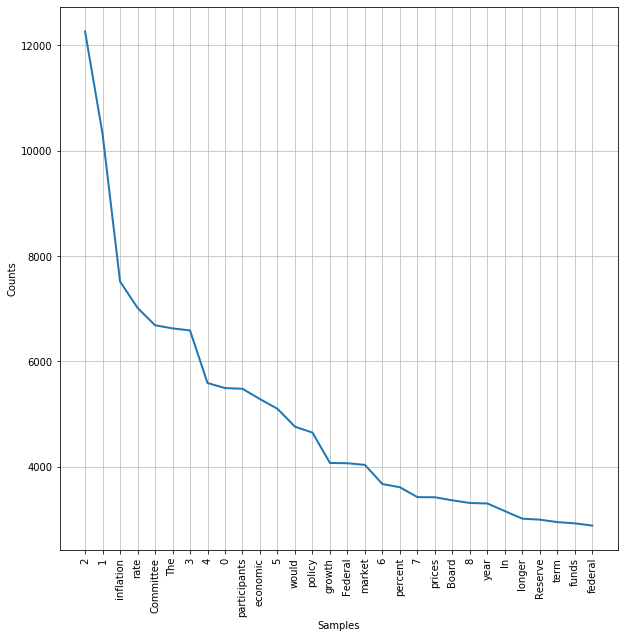

In [18]:
plt.figure(figsize=(10,10))
fdist.plot(30)

### Updating Stopwords

In [19]:
stop_words_updated = list(stop_words) + ['Committee','The','participants','Board','1','2','3','4','5','6','7','8','9','0',',','.',':',';','(',')','tivity','ac','applyreasonable','onthe']
final_tokens=[]
for w in tokenized_review_list:
    if w not in stop_words_updated:
        final_tokens.append(w)
fdist_final = FreqDist(final_tokens)
print(fdist_final)

<FreqDist with 18086 samples and 714803 outcomes>


### Plotting new Frequencies

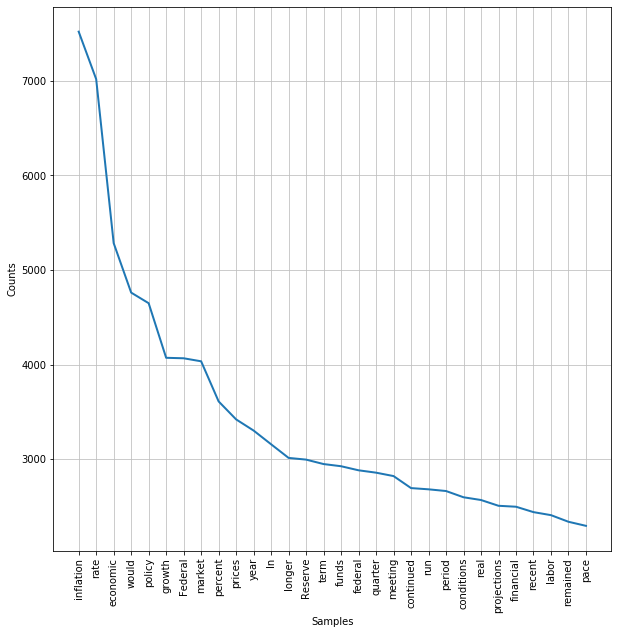

In [20]:
plt.figure(figsize=(10,10))
fdist_final.plot(30)

### Setting Features and Target Variables

In [21]:
X = minutes_df['Tokenized Minutes']
y = minutes_df['Category']
print(X)
print(y)

1      [Minutes, of, the, Federal, Open, Market, Comm...
2      [Minutes, of, the, Federal, Open, Market, Comm...
3      [Minutes, of, the, Federal, Open, Market, Comm...
4      [Minutes, of, the, Federal, Open, Market, Comm...
5      [Minutes, of, the, Federal, Open, Market, Comm...
                             ...                        
126    [August, 10, 2004A, meeting, of, the, Federal,...
127    [June, 29, 30, 2004A, meeting, of, the, Federa...
128    [May, 4, 2004A, meeting, of, the, Federal, Ope...
129    [March, 16, 2004A, meeting, of, the, Federal, ...
130    [January, 27, 28, 2004A, meeting, of, the, Fed...
Name: Tokenized Minutes, Length: 130, dtype: object
1      Positive
2      Negative
3      Positive
4          Flat
5      Positive
         ...   
126    Positive
127    Negative
128    Positive
129        Flat
130    Negative
Name: Category, Length: 130, dtype: object


### Filtering Minutes

In [22]:
filtered_X = []
for minute in X:
    filtered_minute=[]
    for w in minute:
        if w not in stop_words_updated:
            filtered_minute.append(w)
    filtered_X.append(filtered_minute)
filtered_X

[['Minutes',
  'Federal',
  'Open',
  'Market',
  'March',
  '15',
  '2020',
  'A',
  'joint',
  'meeting',
  'Federal',
  'Open',
  'Market',
  'Governors',
  'held',
  'videoconfer',
  'ence',
  'Sunday',
  'March',
  '15',
  '2020',
  '10',
  '00',
  'PRESENT',
  'Jerome',
  'H',
  'Powell',
  'Chair',
  'John',
  'C',
  'Williams',
  'Vice',
  'Chair',
  'Michelle',
  'W',
  'Bowman',
  'Lael',
  'Brainard',
  'Richard',
  'H',
  'Clarida',
  'Patrick',
  'Harker',
  'Robert',
  'S',
  'Kaplan',
  'Neel',
  'Kashkari',
  'Loretta',
  'J',
  'Mester',
  'Randal',
  'K',
  'Quarles',
  'Thomas',
  'I',
  'Barkin',
  'Raphael',
  'W',
  'Bostic',
  'Mary',
  'C',
  'Daly',
  'Charles',
  'L',
  'Evans',
  'Alternate',
  'Members',
  'Federal',
  'Open',
  'Market',
  'James',
  'Bullard',
  'Esther',
  'L',
  'George',
  'Eric',
  'Rosengren',
  'Presidents',
  'Federal',
  'Reserve',
  'Banks',
  'St',
  'Louis',
  'Kansas',
  'City',
  'Boston',
  'respectively',
  'James',
  'A',
 

### Lemmatizing Minutes

In [23]:
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
lemmatized_X=[]
for minute in filtered_X:
    lemmatized_minute=[]
    for w in minute:
        lemmatized_minute.append(lemmatizer.lemmatize(w))
    lemmatized_X.append(lemmatized_minute)
lemmatized_X

[['Minutes',
  'Federal',
  'Open',
  'Market',
  'March',
  '15',
  '2020',
  'A',
  'joint',
  'meeting',
  'Federal',
  'Open',
  'Market',
  'Governors',
  'held',
  'videoconfer',
  'ence',
  'Sunday',
  'March',
  '15',
  '2020',
  '10',
  '00',
  'PRESENT',
  'Jerome',
  'H',
  'Powell',
  'Chair',
  'John',
  'C',
  'Williams',
  'Vice',
  'Chair',
  'Michelle',
  'W',
  'Bowman',
  'Lael',
  'Brainard',
  'Richard',
  'H',
  'Clarida',
  'Patrick',
  'Harker',
  'Robert',
  'S',
  'Kaplan',
  'Neel',
  'Kashkari',
  'Loretta',
  'J',
  'Mester',
  'Randal',
  'K',
  'Quarles',
  'Thomas',
  'I',
  'Barkin',
  'Raphael',
  'W',
  'Bostic',
  'Mary',
  'C',
  'Daly',
  'Charles',
  'L',
  'Evans',
  'Alternate',
  'Members',
  'Federal',
  'Open',
  'Market',
  'James',
  'Bullard',
  'Esther',
  'L',
  'George',
  'Eric',
  'Rosengren',
  'Presidents',
  'Federal',
  'Reserve',
  'Banks',
  'St',
  'Louis',
  'Kansas',
  'City',
  'Boston',
  'respectively',
  'James',
  'A',
 

In [24]:
joined_X = []
for minute in lemmatized_X:
    joined_minute = ' '.join(minute)
    joined_X.append(joined_minute)
joined_X

['Minutes Federal Open Market March 15 2020 A joint meeting Federal Open Market Governors held videoconfer ence Sunday March 15 2020 10 00 PRESENT Jerome H Powell Chair John C Williams Vice Chair Michelle W Bowman Lael Brainard Richard H Clarida Patrick Harker Robert S Kaplan Neel Kashkari Loretta J Mester Randal K Quarles Thomas I Barkin Raphael W Bostic Mary C Daly Charles L Evans Alternate Members Federal Open Market James Bullard Esther L George Eric Rosengren Presidents Federal Reserve Banks St Louis Kansas City Boston respectively James A Clouse Secretary Matthew M Luecke Deputy Secretary Michelle A Smith Assistant Secretary Mark E Van Der Weide General Counsel Michael Held Deputy General Counsel Thomas Laubach Economist Stacey Tevlin Economist Beth Anne Wilson Economist Shaghil Ahmed Michael Dotsey Joseph W Gruber Beverly Hirtle David E Lebow Trevor A Reeve Ellis W Tallman Associate Economists Lorie K Logan Manager System Open Market Account Ann E Misback Secretary Office Secret

In [25]:
negative_df = minutes_df[minutes_df['Category']=='Negative']
flat_df = minutes_df[minutes_df['Category']=='Flat']
minutes_df_resampled = pd.concat([minutes_df, negative_df, flat_df])
minutes_df_resampled

,Date,Minutes,Release Date,End Date,Return,Tokenized Minutes,Category
1,2020-03-15,Minutes of the Federal Open Market Committee...,2020-04-05,2020-05-03,0.116434,"[Minutes, of, the, Federal, Open, Market, Comm...",Positive
2,2020-01-29,Minutes of the Federal Open Market Committee J...,2020-02-19,2020-03-18,-0.189034,"[Minutes, of, the, Federal, Open, Market, Comm...",Negative
3,2019-12-11,Minutes of the Federal Open Market Committee...,2020-01-01,2020-01-29,0.024924,"[Minutes, of, the, Federal, Open, Market, Comm...",Positive
4,2019-10-30,Minutes of the Federal Open Market Committee O...,2019-11-20,2019-12-18,0.008659,"[Minutes, of, the, Federal, Open, Market, Comm...",Flat
5,2019-09-18,Minutes of the Federal Open Market Committee S...,2019-10-09,2019-11-06,0.046604,"[Minutes, of, the, Federal, Open, Market, Comm...",Positive
...,...,...,...,...,...,...,...
119,2005-06-30,"June 29-30, 2005A meeting of the Federal Open ...",2005-07-21,2005-08-18,0.008777,"[June, 29, 30, 2005A, meeting, of, the, Federa...",Flat
120,2005-05-03,"May 3, 2005A meeting of the Federal Open Marke...",2005-05-24,2005-06-21,0.008241,"[May, 3, 2005A, meeting, of, the, Federal, Ope...",Flat
122,2005-02-02,"February 1-2, 2005A meeting of the Federal Ope...",2005-02-23,2005-03-23,-0.002293,"[February, 1, 2, 2005A, meeting, of, the, Fede...",Flat
125,2004-09-21,"September 21, 2004A meeting of the Federal Ope...",2004-10-12,2004-11-09,0.007755,"[September, 21, 2004A, meeting, of, the, Feder...",Flat


In [26]:
def process_article(article):
    tokens = nltk.word_tokenize(article)
    stopwords_removed = [token.lower() for token in tokens if token.lower() not in stop_words_updated]
    return stopwords_removed 

In [27]:
df_freq_positive = minutes_df_resampled[minutes_df_resampled['Category']=='Positive']
df_freq_negative = minutes_df_resampled[minutes_df_resampled['Category']=='Negative']
df_freq_flat = minutes_df_resampled[minutes_df_resampled['Category']=='Flat']

In [28]:
data_pos = df_freq_positive['Minutes']
data_neg = df_freq_negative['Minutes']
data_flat = df_freq_flat['Minutes']

In [29]:
pros_pos = list(map(process_article, data_pos))
pros_neg = list(map(process_article, data_neg))
pros_flat = list(map(process_article, data_flat))

In [30]:
total_vocab_pos = set()
for comment in pros_pos:
    total_vocab_pos.update(comment)
len(total_vocab_pos)

15994

In [31]:
total_vocab_neg = set()
for comment in pros_neg:
    total_vocab_neg.update(comment)
len(total_vocab_neg)

11851

In [32]:
total_vocab_flat = set()
for comment in pros_flat:
    total_vocab_flat.update(comment)
len(total_vocab_flat)

10314

In [33]:
flat_pos = [item for sublist in pros_pos for item in sublist]
flat_neg = [item for sublist in pros_neg for item in sublist]
flat_flat = [item for sublist in pros_flat for item in sublist]

In [34]:
pos_freq = FreqDist(flat_pos)
neg_freq = FreqDist(flat_neg)
flat_freq = FreqDist(flat_flat)

In [35]:
pos_total_word_count = sum(pos_freq.values())
pos_top_25 = pos_freq.most_common(25)
print("Word \t\t Normalized Frequency")
print()
for word in pos_top_25:
    normalized_frequency = word[1]/pos_total_word_count
    print("{} \t\t {:.4}".format(word[0], normalized_frequency))

Word 		 Normalized Frequency

inflation 		 0.01131
rate 		 0.01019
federal 		 0.01003
economic 		 0.00894
market 		 0.00839
committee 		 0.007047
policy 		 0.007047
would 		 0.006923
percent 		 0.00689
growth 		 0.006193
monetary 		 0.004731
board 		 0.004691
prices 		 0.004669
funds 		 0.0044
real 		 0.004319
projections 		 0.004306
financial 		 0.004157
conditions 		 0.004069
year 		 0.004055
meeting 		 0.004034
reserve 		 0.003824
continued 		 0.003813
period 		 0.003775
recent 		 0.003716
quarter 		 0.003635


In [36]:
neg_total_word_count = sum(neg_freq.values())
neg_top_25 = neg_freq.most_common(25)
print("Word \t\t Normalized Frequency")
print()
for word in neg_top_25:
    normalized_frequency = word[1]/neg_total_word_count
    print("{} \t\t {:.4}".format(word[0], normalized_frequency))

Word 		 Normalized Frequency

inflation 		 0.01076
federal 		 0.009517
rate 		 0.00855
market 		 0.008467
economic 		 0.008091
committee 		 0.008046
policy 		 0.006725
would 		 0.006586
growth 		 0.006039
prices 		 0.005884
percent 		 0.005115
board 		 0.004916
financial 		 0.004695
monetary 		 0.004634
reserve 		 0.004341
meeting 		 0.004103
recent 		 0.004098
conditions 		 0.004037
year 		 0.003987
quarter 		 0.003937
real 		 0.003937
continued 		 0.003877
bank 		 0.003788
period 		 0.003755
open 		 0.003678


In [37]:
flat_total_word_count = sum(flat_freq.values())
flat_top_25 = flat_freq.most_common(25)
print("Word \t\t Normalized Frequency")
print()
for word in neg_top_25:
    normalized_frequency = word[1]/flat_total_word_count
    print("{} \t\t {:.4}".format(word[0], normalized_frequency))

Word 		 Normalized Frequency

inflation 		 0.0139
federal 		 0.0123
rate 		 0.01105
market 		 0.01094
economic 		 0.01045
committee 		 0.0104
policy 		 0.008688
would 		 0.00851
growth 		 0.007802
prices 		 0.007602
percent 		 0.006609
board 		 0.006352
financial 		 0.006066
monetary 		 0.005987
reserve 		 0.005609
meeting 		 0.005301
recent 		 0.005294
conditions 		 0.005216
year 		 0.005151
quarter 		 0.005087
real 		 0.005087
continued 		 0.005009
bank 		 0.004894
period 		 0.004851
open 		 0.004751


In [38]:
pos_bar_counts = [x[1] for x in pos_freq.most_common(25)]
pos_bar_words = [x[0] for x in pos_freq.most_common(25)]

neg_bar_counts = [x[1] for x in neg_freq.most_common(25)]
neg_bar_words = [x[0] for x in neg_freq.most_common(25)]

flat_bar_counts = [x[1] for x in flat_freq.most_common(25)]
flat_bar_words = [x[0] for x in flat_freq.most_common(25)]

In [39]:
color = cm.viridis_r(np.linspace(.4,.8, 30))

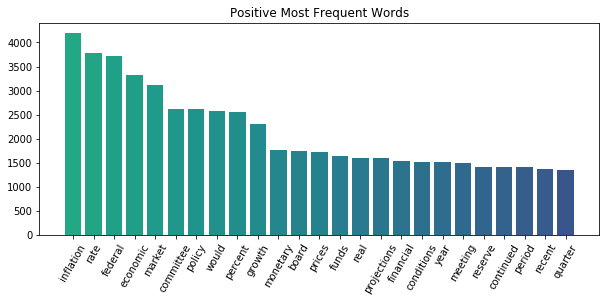

In [40]:
new_figure = plt.figure(figsize=(16,4))

ax = new_figure.add_subplot(121)

ax.bar(pos_bar_words, pos_bar_counts, color=color)


ax.title.set_text('Positive Most Frequent Words')

for ax in new_figure.axes:
    plt.sca(ax)
    plt.xticks(rotation=60)

plt.tight_layout(pad=0)

plt.show()

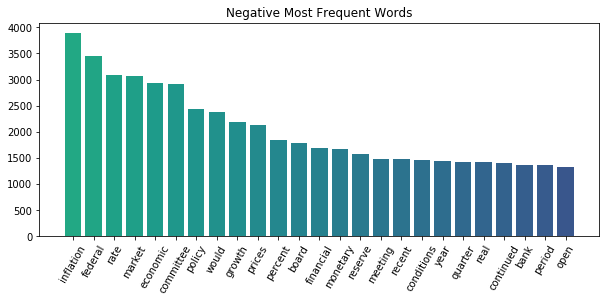

In [41]:
new_figure = plt.figure(figsize=(16,4))

ax = new_figure.add_subplot(121)

ax.bar(neg_bar_words, neg_bar_counts, color=color)


ax.title.set_text('Negative Most Frequent Words')

for ax in new_figure.axes:
    plt.sca(ax)
    plt.xticks(rotation=60)

plt.tight_layout(pad=0)

plt.show()

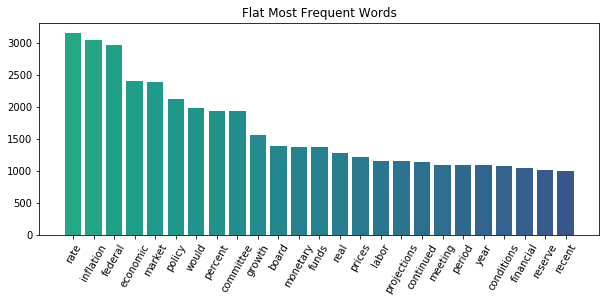

In [42]:
new_figure = plt.figure(figsize=(16,4))

ax = new_figure.add_subplot(121)

ax.bar(flat_bar_words, flat_bar_counts, color=color)

ax.title.set_text('Flat Most Frequent Words')

for ax in new_figure.axes:
    plt.sca(ax)
    plt.xticks(rotation=60)

plt.tight_layout(pad=0)


plt.show()

In [43]:
from wordcloud import WordCloud
pos_dictionary = dict(zip(pos_bar_words, pos_bar_counts))
neg_dictionary = dict(zip(neg_bar_words, neg_bar_counts))
flat_dictionary = dict(zip(flat_bar_words, flat_bar_counts))

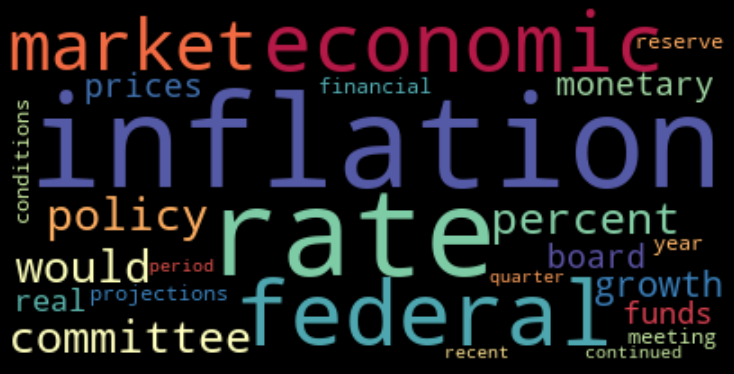

In [44]:
wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(pos_dictionary)

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

plt.show()

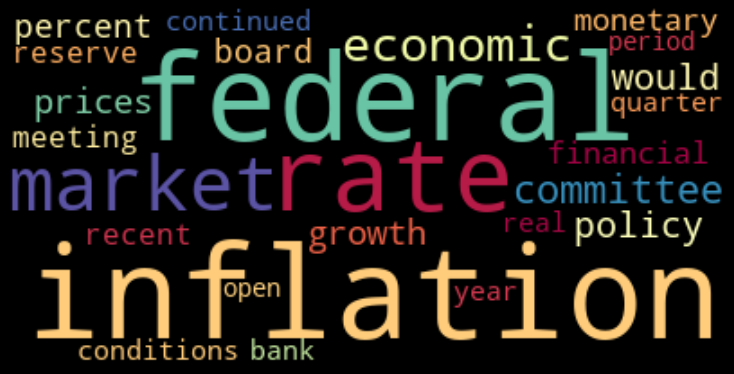

In [45]:
wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(neg_dictionary)

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

plt.show()

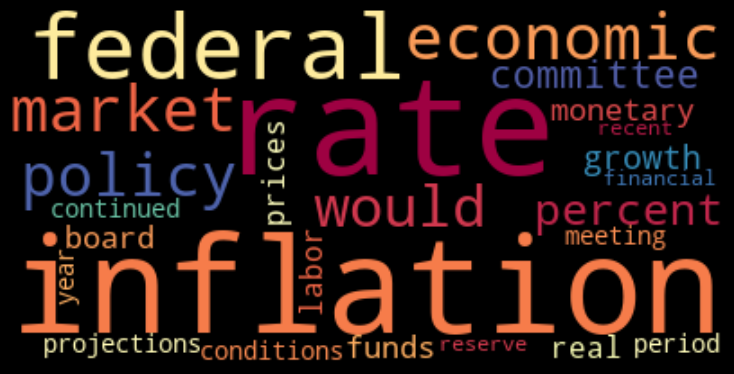

In [46]:
wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(flat_dictionary)

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

plt.show()

### Train Test Split

In [47]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(joined_X, y, random_state=17)

### Balancing Classes

In [48]:
y_train_reset = y_train.reset_index()
y_train_reset.drop(labels=['index'],axis=1,inplace=True)
negative_indices = y_train_reset[y_train_reset['Category'] == 'Negative']
flat_indices = y_train_reset[y_train_reset['Category'] == 'Flat']

In [49]:
import random
negative_indices_count = len(negative_indices)
flat_indices_count = len(flat_indices)
negative_add = list(y_train.values).count('Positive') - list(y_train.values).count('Negative')
flat_add = list(y_train.values).count('Positive') - list(y_train.values).count('Flat')
count = len(X)+1
for num in range(0,negative_add):
    list_index = random.randrange(0, negative_indices_count, 1)
    X_train_index = negative_indices.index[list_index]
    new_value = X_train[X_train_index]
    X_train.append(new_value)
    y_train[count] = 'Negative'
    count=count+1
for num in range(0,flat_add):
    list_index = random.randrange(0, flat_indices_count, 1)
    X_train_index = flat_indices.index[list_index]
    new_value = X_train[X_train_index]
    X_train.append(new_value)
    y_train[count] = 'Flat'
    count=count+1
    

### TF IDF Vectorizer

In [50]:
tfidf_vectorizer = TfidfVectorizer()
tfidf_X_train = tfidf_vectorizer.fit_transform(X_train)
tfidf_X_test = tfidf_vectorizer.transform(X_test)

In [51]:
y_train_reset.loc[1,'Category']

'Negative'

In [52]:
flat_add+negative_add

62

In [53]:
minutes_df[minutes_df['Date']=='05/10/2006']

,Date,Minutes,Release Date,End Date,Return,Tokenized Minutes,Category
112,2006-05-10,"May 10, 2006A meeting of the Federal Open Mark...",2006-05-31,2006-06-28,-0.014086,"[May, 10, 2006A, meeting, of, the, Federal, Op...",Negative


In [54]:
y_train[192-50]

'Negative'

In [55]:
X_train[-50]

'January 30 31 2007A meeting Federal Open Market held office Governorsof Federal Reserve System Washington D C Tuesday January 30 2007 00 p andcontinued Wednesday January 31 2007 00 Present Mr Bernanke ChairmanMr Geithner Vice ChairmanMs BiesMr HoenigMr KohnMr KrosznerMs MinehanMr MishkinMr MoskowMr PooleMr WarshMr Fisher Ms Pianalto Messrs Plosser Stern Alternate Members theFederal Open Market CommitteeMr Lacker Ms Yellen Presidents Federal Reserve Banks Richmondand San Francisco respectivelyMr Barron First Vice President Federal Reserve Bank AtlantaMr Reinhart Secretary EconomistMs Danker Deputy SecretaryMs Smith Assistant SecretaryMr Skidmore Assistant SecretaryMr Alvarez General CounselMr Baxter Deputy General CounselMs Johnson EconomistMr Stockton EconomistMessrs Connors Evans Fuhrer Kamin Madigan Rasche Sellon Slifman Tracy Wilcox Associate EconomistsMr Dudley Manager System Open Market AccountMessrs Clouse English Associate Directors Division Monetary Affairs GovernorsMs Liang M

## Modeling

### Naive Bayes Model

In [56]:
from sklearn.naive_bayes import MultinomialNB
nb_classifier = MultinomialNB()
nb_classifier.fit(tfidf_X_train,y_train)
train_preds = nb_classifier.predict(tfidf_X_train)
test_preds = nb_classifier.predict(tfidf_X_test)

In [57]:
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
print(accuracy_score(y_train, train_preds))
print(accuracy_score(y_test, test_preds))

0.6415094339622641
0.30303030303030304


In [58]:
print(f1_score(y_train, train_preds, average = 'weighted'))
print(f1_score(y_test, test_preds, average = 'weighted'))

0.6167483433502849
0.28217709327154605


### Confusion Matrices

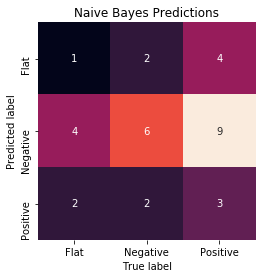

In [59]:
import seaborn as sns
mat = confusion_matrix(y_test, test_preds)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.title('Naive Bayes Predictions');

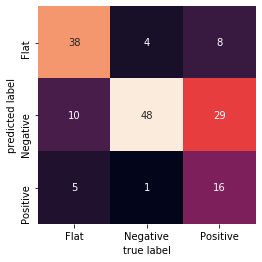

In [60]:
import seaborn as sns
mat = confusion_matrix(y_train, train_preds)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('true label')
plt.ylabel('predicted label');

### Random Forrest

In [61]:
from sklearn.ensemble import RandomForestClassifier
rf_classifier = RandomForestClassifier(n_estimators=100,min_samples_leaf=7, max_depth=5)
rf_classifier.fit(tfidf_X_train,y_train)
rf_train_preds = rf_classifier.predict(tfidf_X_train)
rf_test_preds = rf_classifier.predict(tfidf_X_test)

In [62]:
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
print(accuracy_score(y_train, rf_train_preds))
print(accuracy_score(y_test, rf_test_preds))

0.9811320754716981
0.36363636363636365


In [63]:
print(f1_score(y_train, rf_train_preds, average = 'weighted'))
print(f1_score(y_test, rf_test_preds, average = 'weighted'))

0.9811169502093168
0.32678132678132676


### Confusion Matrices 

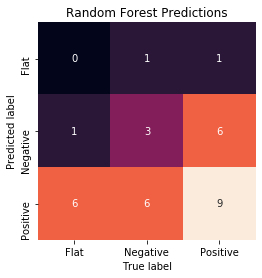

In [64]:
rf_mat = confusion_matrix(y_test, rf_test_preds)
sns.heatmap(rf_mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.title('Random Forest Predictions');

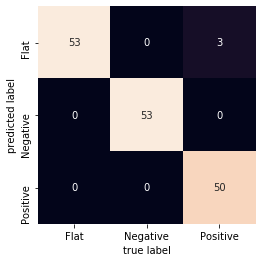

In [65]:
import seaborn as sns
mat = confusion_matrix(y_train, rf_train_preds)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('true label')
plt.ylabel('predicted label');

### Gridsearch Accuracy

In [66]:
rf_classifier.get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [67]:
scorer = sklearn.metrics.make_scorer(sklearn.metrics.f1_score, average = 'weighted')

In [68]:
from sklearn.model_selection import GridSearchCV
p={'max_depth': range(3,11),
   'min_samples_leaf': range(5,15,1),
   'class_weight' : ['balanced']}

In [69]:
rfc = RandomForestClassifier(random_state = 23,
                             n_estimators = 100,)
grid_tree=GridSearchCV(rfc,p, cv=5, scoring='accuracy', verbose=1)
grid_tree.fit(tfidf_X_train,y_train)

Fitting 5 folds for each of 80 candidates, totalling 400 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:   42.9s finished


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=23),
             param_grid={'class_weight': ['balanced'],
                         'max_depth': range(3, 11),
                         'min_samples_leaf': range(5, 15)},
             scoring='accuracy', verbose=1)

In [70]:
print(grid_tree.best_score_)

0.7733870967741936


In [71]:
print(grid_tree.best_params_)

{'class_weight': 'balanced', 'max_depth': 7, 'min_samples_leaf': 6}


In [75]:
rf_grid = grid_tree.best_estimator_

In [76]:
rf_grid.fit(tfidf_X_train,y_train)

RandomForestClassifier(class_weight='balanced', max_depth=7, min_samples_leaf=6,
                       random_state=23)

In [77]:
rf_grid_train_preds = rf_grid.predict(tfidf_X_train)
rf_grid_test_preds = rf_grid.predict(tfidf_X_test)

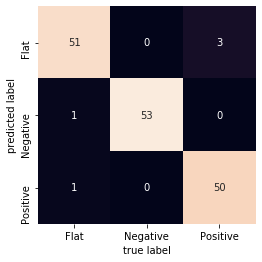

In [78]:
rf_mat = confusion_matrix(y_train, rf_grid_train_preds)
sns.heatmap(rf_mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('true label')
plt.ylabel('predicted label');

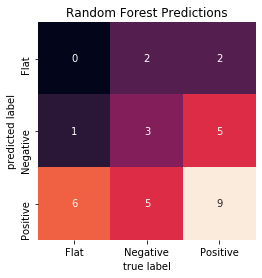

In [79]:
rf_mat = confusion_matrix(y_test, rf_grid_test_preds)
sns.heatmap(rf_mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('true label')
plt.ylabel('predicted label')
plt.title('Random Forest Predictions');

In [80]:
print(accuracy_score(y_train, rf_grid_train_preds))
print(accuracy_score(y_test, rf_grid_test_preds))

0.9685534591194969
0.36363636363636365


In [81]:
print(f1_score(y_train, rf_grid_train_preds, average = 'weighted'))
print(f1_score(y_test, rf_grid_test_preds, average = 'weighted'))

0.9684878983944404
0.33811802232854865


### Gridsearch F1 Score

In [82]:
rfc = RandomForestClassifier(random_state = 23,
                             n_estimators = 100,)
grid_tree2=GridSearchCV(rfc,p, cv=5, scoring=scorer, verbose=1)
grid_tree2.fit(tfidf_X_train,y_train)

Fitting 5 folds for each of 80 candidates, totalling 400 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:   42.3s finished


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=23),
             param_grid={'class_weight': ['balanced'],
                         'max_depth': range(3, 11),
                         'min_samples_leaf': range(5, 15)},
             scoring=make_scorer(f1_score, average=weighted), verbose=1)

In [83]:
rf_grid_f1 = grid_tree2.best_estimator_

In [84]:
rf_grid_f1.fit(tfidf_X_train,y_train)

RandomForestClassifier(class_weight='balanced', max_depth=8, min_samples_leaf=6,
                       random_state=23)

In [85]:
print(grid_tree2.best_params_)

{'class_weight': 'balanced', 'max_depth': 8, 'min_samples_leaf': 6}


In [86]:
rf_grid_train_preds_f1 = rf_grid_f1.predict(tfidf_X_train)
rf_grid_test_preds_f1 = rf_grid_f1.predict(tfidf_X_test)

In [87]:
print(accuracy_score(y_train, rf_grid_train_preds_f1))
print(accuracy_score(y_test, rf_grid_test_preds_f1))

0.9685534591194969
0.3939393939393939


In [88]:
print(f1_score(y_train, rf_grid_train_preds_f1, average = 'weighted'))
print(f1_score(y_test, rf_grid_test_preds_f1, average = 'weighted'))

0.9684878983944404
0.363090363090363


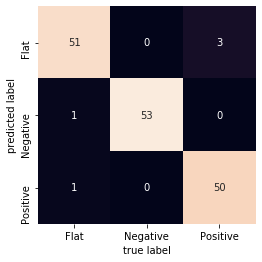

In [89]:
rf_mat = confusion_matrix(y_train, rf_grid_train_preds_f1)
sns.heatmap(rf_mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('true label')
plt.ylabel('predicted label');

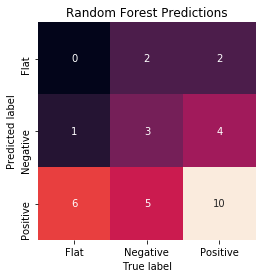

In [90]:
rf_mat = confusion_matrix(y_test, rf_grid_test_preds_f1)
sns.heatmap(rf_mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Flat', 'Negative','Positive'], yticklabels=['Flat', 'Negative','Positive'])
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.title('Random Forest Predictions');